<a href="https://colab.research.google.com/github/JackL490/super-adventure-188/blob/main/Adv_Task2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Perform an Adversarial attack.

For the second part of the project we consider a trained model (MobileNet) which is trained on the imagenet dataset. 

We use an evasion attack called [FGSM](https://neptune.ai/blog/adversarial-attacks-on-neural-networks-exploring-the-fast-gradient-sign-method#:~:text=The%20Fast%20Gradient%20Sign%20Method%20(FGSM)%20combines%20a%20white%20box,model%20into%20making%20wrong%20predictions.) to fool the neural network into making incorrect predictions.

## Import Packages.

Import the necessary packages we continue to use Tensorflow and Keras

In [ ]:
import tensorflow as tf
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from keras.preprocessing import image

mpl.rcParams['figure.figsize'] = (8, 8)
mpl.rcParams['axes.grid'] = False

## Load the Pretrained model. 

We use the [MobileNetV2](https://arxiv.org/abs/1801.04381) model trained on the [Imagenet](https://www.image-net.org/) dataset. 

In [ ]:
pretrained_model = tf.keras.applications.MobileNetV2(include_top=True,
                                                     weights='imagenet')
pretrained_model.trainable = False

# ImageNet labels
decode_predictions = tf.keras.applications.mobilenet_v2.decode_predictions

### Helper Function for Data Processing


Following functions can be used for data processing. Dont worry about these, just use them. 

In [148]:
# Helper function to preprocess the image so that it can be inputted in MobileNetV2
def preprocess(image):
  image = tf.cast(image, tf.float32)
  image = tf.image.resize(image, (224, 224))
  image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
  image = image[None, ...]
  return image

# Helper function to extract labels from probability vector
def get_imagenet_label(probs):
  return decode_predictions(probs, top=1)[0][0]

## Load an Image. 


Load any image, we consider an image of a Golden Retriever. 

In [ ]:
image_raw = tf.io.read_file('/content/panda_bear_lol.jpg')
image = tf.image.decode_image(image_raw)

image = preprocess(image)
image_probs = pretrained_model.predict(image)

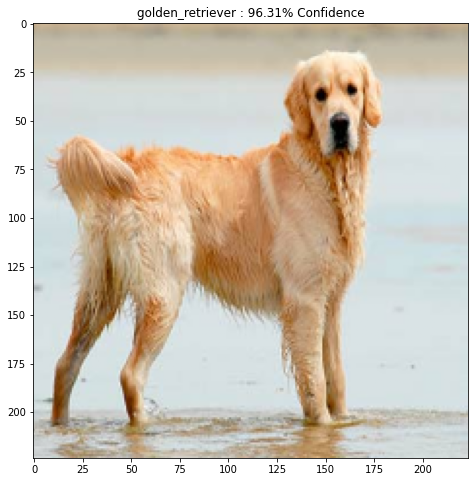

In [ ]:
plt.figure()
plt.imshow(image[0] * 0.5 + 0.5)  # To change [-1, 1] to [0,1]
_, image_class, class_confidence = get_imagenet_label(image_probs)
plt.title('{} : {:.2f}% Confidence'.format(image_class, class_confidence*100))
plt.show()

## Create the Adversarial Image. 

We use the FGSM method to create an adversarial image. Be sure to read about FGSM to understand how the attack works. 

In [149]:
loss_object = tf.keras.losses.CategoricalCrossentropy()

def create_adversarial_pattern(input_image, input_label):
  with tf.GradientTape() as tape:
    tape.watch(input_image)
    prediction = pretrained_model(input_image)
    loss = loss_object(input_label, prediction)

  # Get the gradients of the loss w.r.t to the input image.
  gradient = tape.gradient(loss, input_image)
  # Get the sign of the gradients to create the perturbation
  signed_grad = tf.sign(gradient)
  return signed_grad

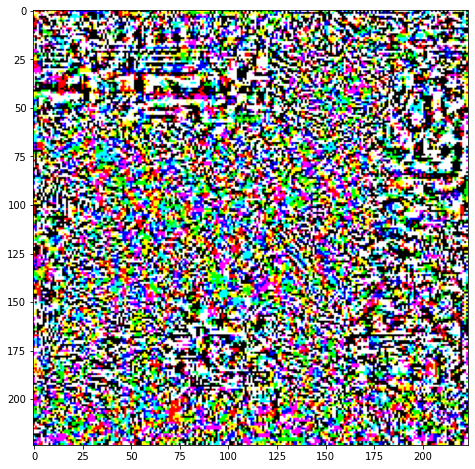

In [ ]:
# Get the input label of the image.
giant_panda_index = 388
golden_retriever_index = 207
label = tf.one_hot(golden_retriever_index, image_probs.shape[-1])
label = tf.reshape(label, (1, image_probs.shape[-1]))

perturbations = create_adversarial_pattern(image, label)
plt.imshow(perturbations[0] * 0.5 + 0.5);  # To change [-1, 1] to [0,1]

In [150]:
def display_images(image, description):
  _, label, confidence = get_imagenet_label(pretrained_model.predict(image))
  plt.figure()
  plt.imshow(image[0]*0.5+0.5)
  plt.title('{} \n {} : {:.2f}% Confidence'.format(description,
                                                   label, confidence*100))
  plt.show()

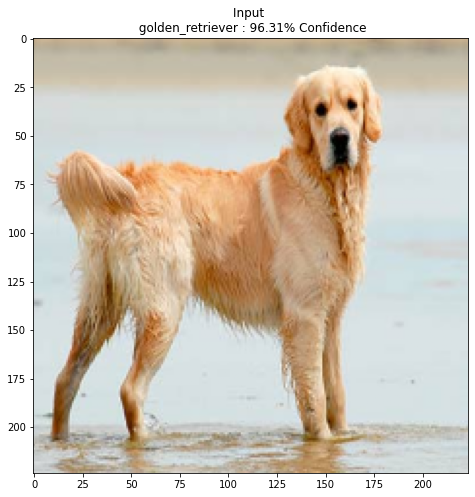

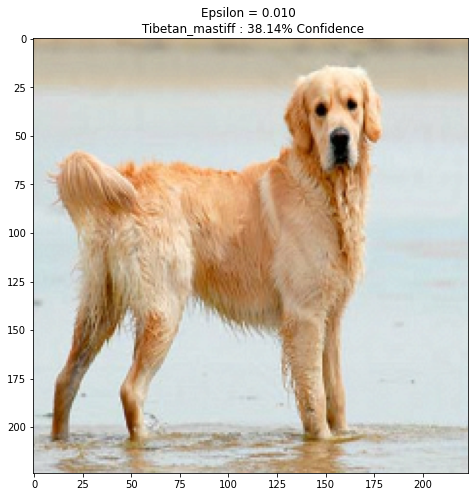

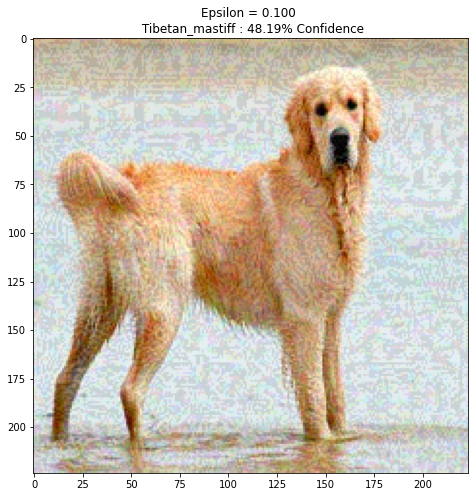

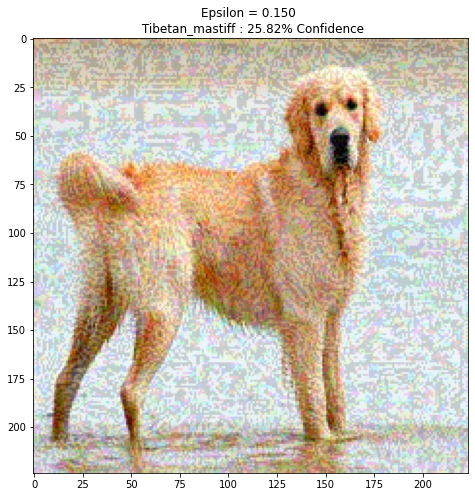

In [ ]:
epsilons = [0, 0.01, 0.1, 0.15]
descriptions = [('Epsilon = {:0.3f}'.format(eps) if eps else 'Input')
                for eps in epsilons]

for i, eps in enumerate(epsilons):
  adv_x = image + eps*perturbations
  adv_x = tf.clip_by_value(adv_x, -1, 1)
  display_images(adv_x, descriptions[i])

# Task2: Perform an Analysis to understand the potency of the attack. 

Your task here is to understand how small a change could change the class output and this is measured by the epsilon value needed to change the class. 

Your task is as follows:

* Pick 10 images each from different classes in imagenet. 
* Perform a perturbation analysis on each of these images. 
* In the analysis you are required to report the smallest epsilon value for which you notice a class change. 
* Make a table for each of the images considered with the minimum epsilon value for the FGSM attack. 

Write the Code for the above below. You can add the table also below. 

In [ ]:
from google.colab import drive
import os
drive.mount('/content/drive/')
os.chdir('/content/drive/My Drive/Colab Notebooks')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
ten_image_names = ["Arctic_fox", #279
                   "llama", #355
                   "white_stork", #127
                   "great_white_shark", #2
                   "broom", #462
                   "weasel", #356
                   "bison", #347
                   "water_tower", #900
                   "toilet_tissue", #999
                   "bee"] #309
ten_image_index = [279, 355, 127, 2, 462, 356, 347, 90, 999, 309]
image = [tf.zeros([0,4]) for i in range(10)]
image_probs = [np.zeros(0) for i in range(10)]
for i in range(10):
  image_raw = tf.io.read_file('/content/drive/My Drive/Colab Notebooks/images/'+ten_image_names[i]+'.jpg')
  image[i] = tf.image.decode_image(image_raw)

  image[i] = preprocess(image[i])
  image_probs[i] = pretrained_model.predict(image[i])

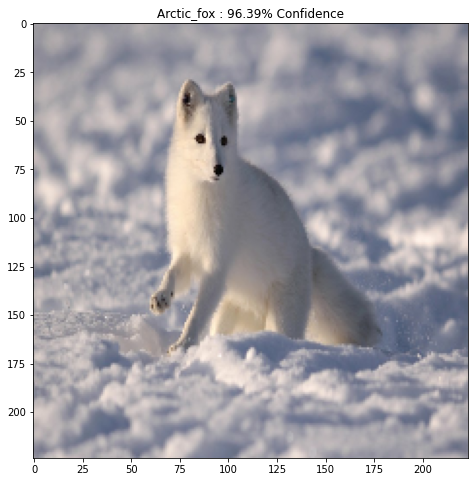

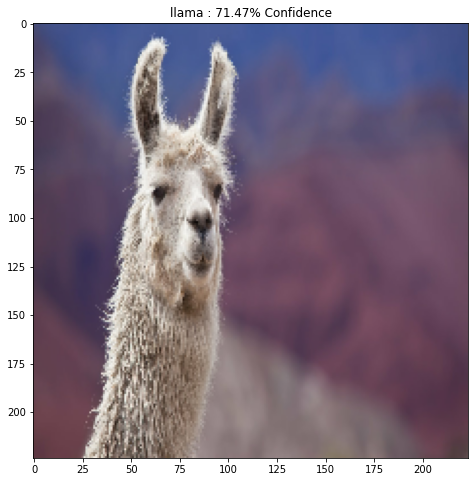

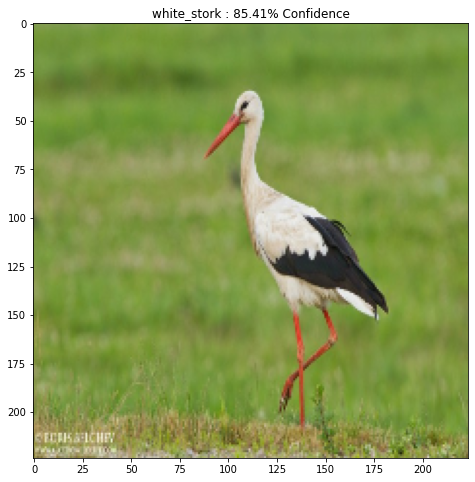

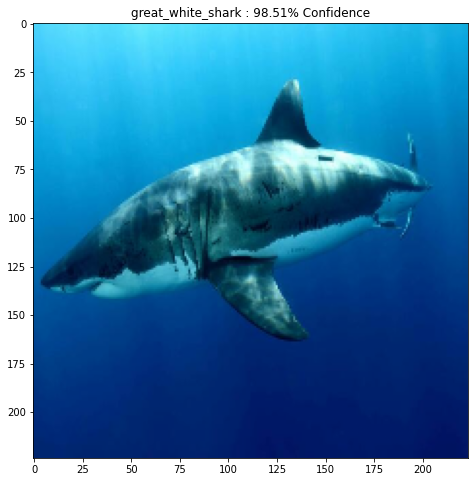

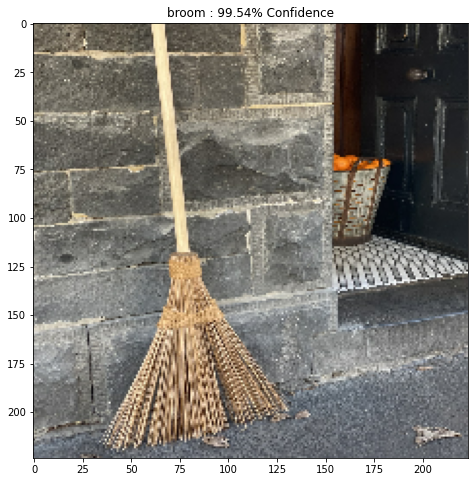

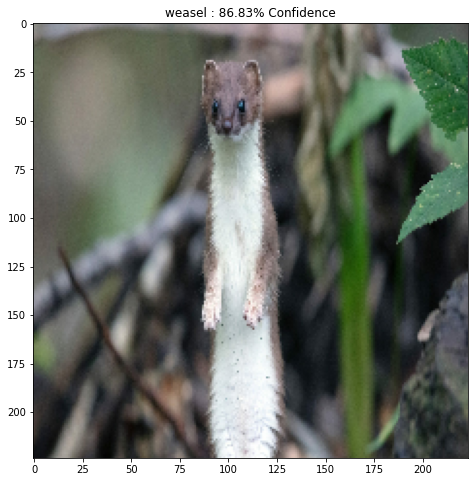

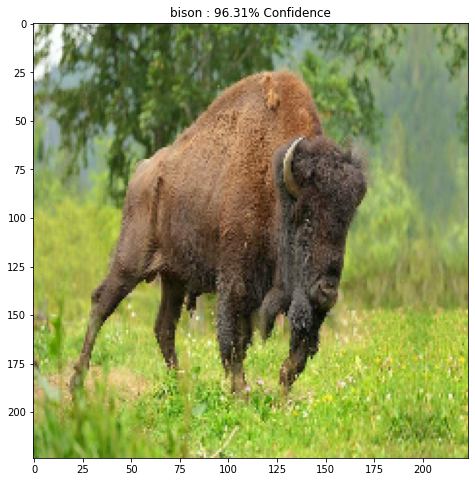

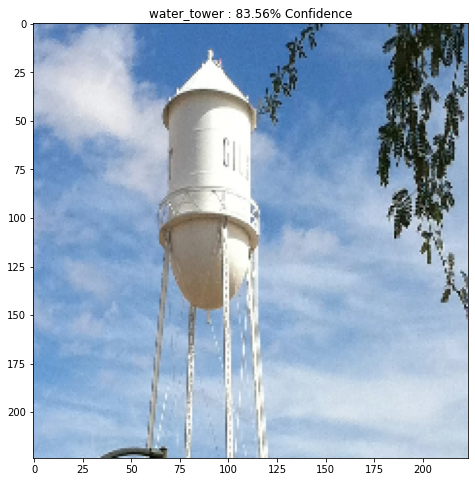

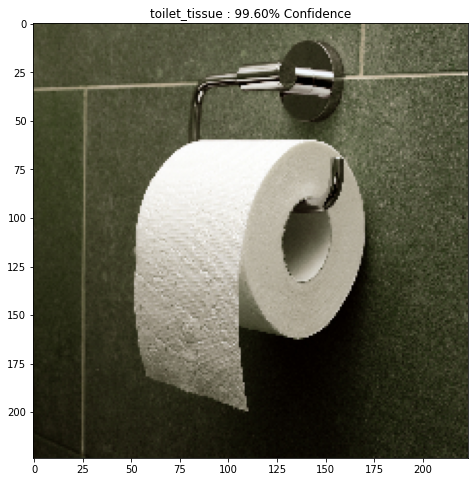

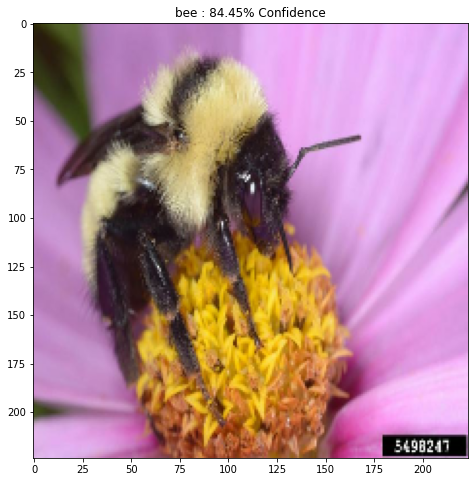

In [ ]:
for i in range(10):
  plt.figure()
  plt.imshow(image[i][0] * 0.5 + 0.5)  # To change [-1, 1] to [0,1]
  _, image_class, class_confidence = get_imagenet_label(image_probs[i])
  plt.title('{} : {:.2f}% Confidence'.format(image_class, class_confidence*100))
  #plt.show()

In [ ]:
eps_result = [0 for i in range(10)]
for i in range(10):
  eps = .001
  label = tf.one_hot(ten_image_index[i], image_probs[i].shape[-1])
  label = tf.reshape(label, (1, image_probs[i].shape[-1]))
  perturbations = create_adversarial_pattern(image[i], label)
  while True: 
    adv_x = image[i] + eps*perturbations
    adv_x = tf.clip_by_value(adv_x, -1, 1)
    _, label, confidence = get_imagenet_label(pretrained_model.predict(adv_x))
    if label != ten_image_names[i]:
      eps_result[i] = eps
      break;
    eps = eps + .001 #I refuse to do proper gradient descent.
    


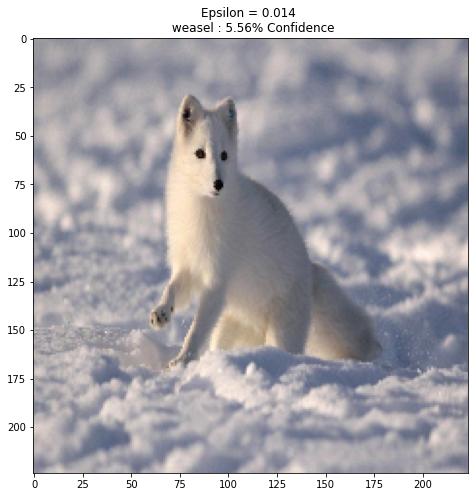

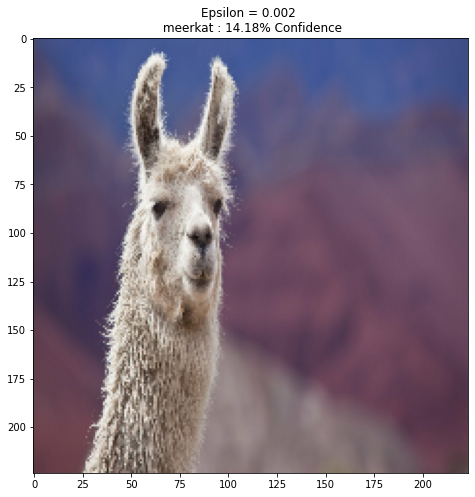

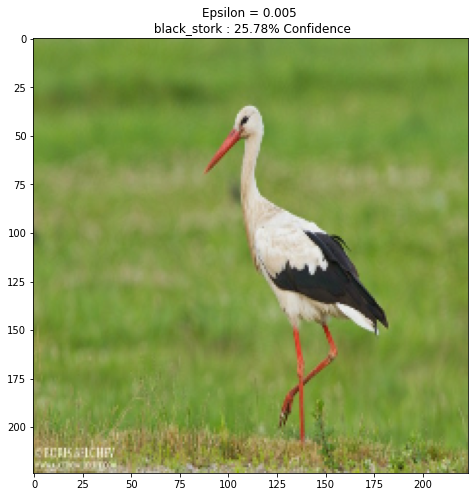

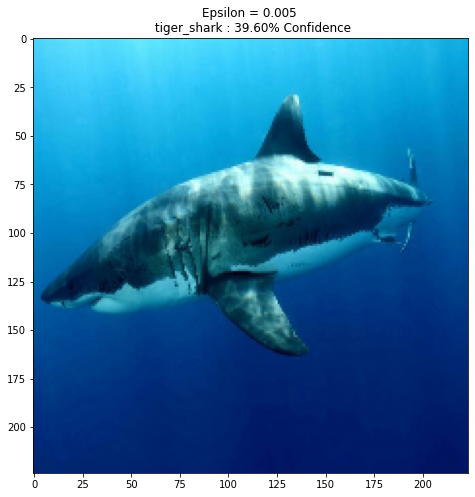

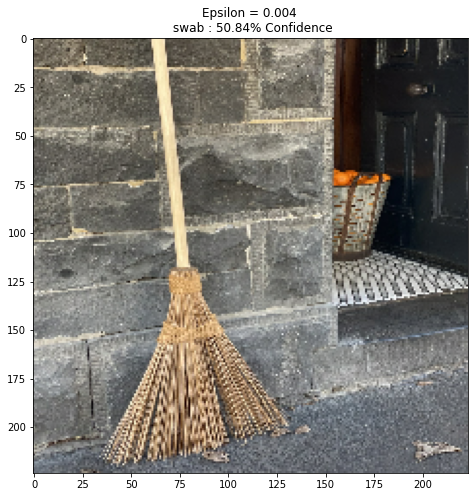

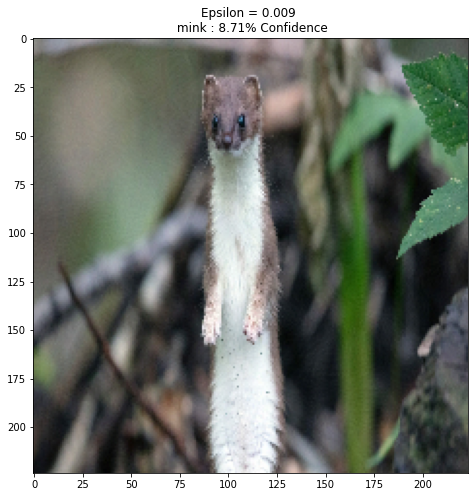

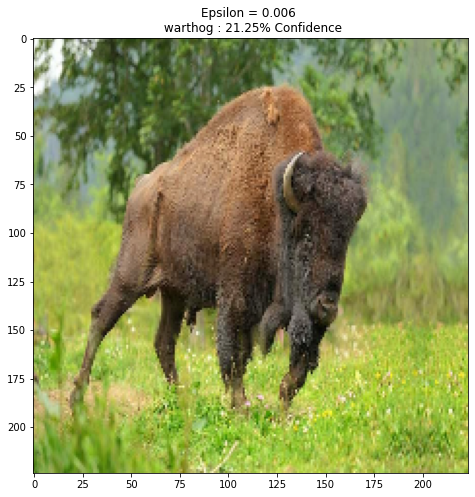

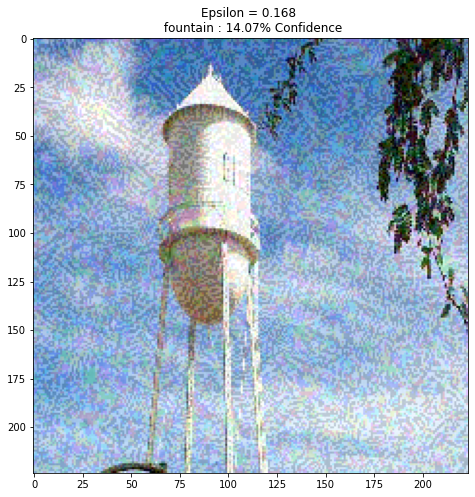

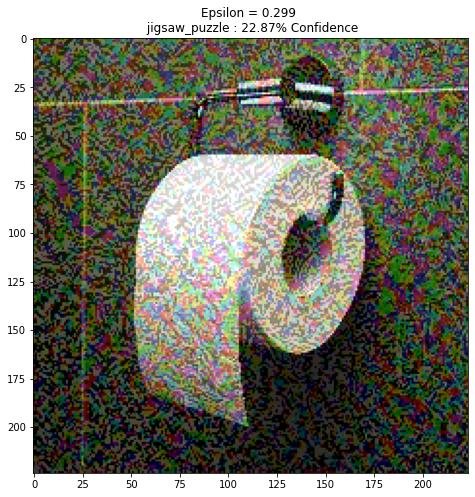

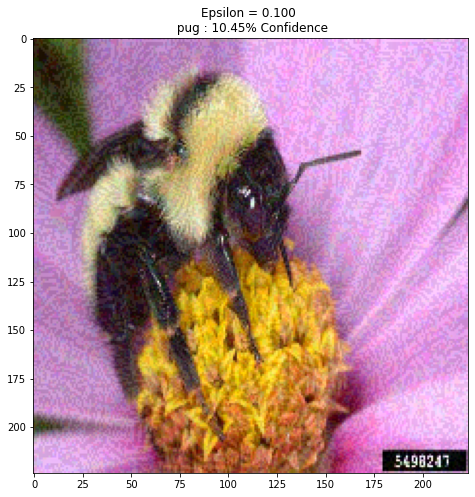

In [ ]:
for i in range(10):
  description = ('Epsilon = {:0.3f}'.format(eps_result[i]))
  label = tf.one_hot(ten_image_index[i], image_probs[i].shape[-1])
  label = tf.reshape(label, (1, image_probs[i].shape[-1]))
  perturbations = create_adversarial_pattern(image[i], label)
  adv_x = image[i] + eps_result[i]*perturbations
  adv_x = tf.clip_by_value(adv_x, -1, 1)
  display_images(adv_x, description)

In [ ]:
import pandas as pd
tabledisplay = pd.DataFrame(data = {'Image/Label': ten_image_names})
tabledisplay['Smallest Epsilon for Class Change for MobileNetV2'] = eps_result
tabledisplay.head(11)

,Image/Label,Smallest Epsilon for Class Change for MobileNetV2
0,Arctic_fox,0.014
1,llama,0.002
2,white_stork,0.005
3,great_white_shark,0.005
4,broom,0.004
5,weasel,0.009
6,bison,0.006
7,water_tower,0.168
8,toilet_tissue,0.299
9,bee,0.100


# Task3: Compare the robustness of the considered model with other models. 

Your task here is to compare how this model (MobileNetV2) compares with other popular object detection models. 

Your task is as follows:

* Consider 5 different models (you can consider various RESNET architectures, any models you find interesting).
* Load the pre-trained weights of the model (trained on imagenet). 
* Perform Task2 on all the considered models. 
* Add all the results in the table. Hence the final table you have 6 columns for each model and epsilon values for each of the 10 images for all 6 models. 


What do you observe? Why do you think this is the case? 

Write the Code for the above below. You can also add the table and answer to the question below. 


In [166]:
pretrained_model = [tf.keras.applications.MobileNetV2(include_top=True,weights='imagenet') for i in range(6)]
decode_predictions = [tf.keras.applications.mobilenet_v2.decode_predictions for i in range(6)]

pretrained_model[1] = tf.keras.applications.VGG16(weights='imagenet')
decode_predictions[1] = tf.keras.applications.vgg16.decode_predictions

pretrained_model[2] = tf.keras.applications.MobileNetV3Small(include_top = True, weights='imagenet', include_preprocessing = True)
decode_predictions[2] = tf.keras.applications.mobilenet_v3.decode_predictions

pretrained_model[3] = tf.keras.applications.DenseNet121(weights='imagenet')
decode_predictions[3] = tf.keras.applications.densenet.decode_predictions

pretrained_model[4] = tf.keras.applications.ResNet101V2(weights='imagenet')
decode_predictions[4] = tf.keras.applications.resnet_v2.decode_predictions

pretrained_model[5] = tf.keras.applications.NASNetMobile(weights='imagenet')
decode_predictions[5] = tf.keras.applications.nasnet.decode_predictions

for i in range(6): pretrained_model[i].trainable = False

def preprocess(image, model):
  image = tf.cast(image, tf.float32)
  image = tf.image.resize(image, (224, 224))
  if model == "mobilenet_v2":
    image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
  elif model == "vgg16":
    image = tf.keras.applications.vgg16.preprocess_input(image)
  elif model == "mobilenet_v3":
    image = tf.keras.applications.mobilenet_v3.preprocess_input(image)
  elif model == "densenet":
    image = tf.keras.applications.densenet.preprocess_input(image)
  elif model == "resnet_v2":
    image = tf.keras.applications.resnet_v2.preprocess_input(image)
  elif model == "nasnet":
    image = tf.keras.applications.nasnet.preprocess_input(image)  
  image = image[None, ...]
  return image


In [167]:
loss_object = tf.keras.losses.CategoricalCrossentropy()

def create_adversarial_pattern(input_image, input_label, modelIndex):
  with tf.GradientTape() as tape:
    tape.watch(input_image)
    prediction = pretrained_model[modelIndex](input_image)
    loss = loss_object(input_label, prediction)

  # Get the gradients of the loss w.r.t to the input image.
  gradient = tape.gradient(loss, input_image)
  # Get the sign of the gradients to create the perturbation
  signed_grad = tf.sign(gradient)
  return signed_grad
def get_imagenet_label(probs, modelIndex):
  return decode_predictions[modelIndex](probs, top=1)[0][0]

In [195]:
#eps_result = [[0 for i in range(10)] for j in range(6)]
processtype = ["mobilenet_v2", "vgg16", "mobilenet_v3", "densenet", "resnet_v2", "nasnet"]
for modelType in range(3,6):
  image = [tf.zeros([0,4]) for i in range(10)]
  image_probs = [np.zeros(0) for i in range(10)]
  for i in range(10):
    image_raw = tf.io.read_file('/content/drive/My Drive/Colab Notebooks/images/'+ten_image_names[i]+'.jpg')
    image[i] = tf.image.decode_image(image_raw)
    image[i] = preprocess(image[i], processtype[modelType])
    image_probs[i] = pretrained_model[modelType].predict(image[i])
    _, label, confidence = get_imagenet_label(image_probs[i], modelType)
    print(label)
  for i in range(10):
    eps = .01
    label = tf.one_hot(ten_image_index[i], image_probs[i].shape[-1])
    label = tf.reshape(label, (1, image_probs[i].shape[-1]))
    perturbations = create_adversarial_pattern(image[i], label, modelType)
    while True: 
      adv_x = image[i] + eps*perturbations
      #adv_x = preprocess(adv_x, processtype[modelType])
      _, label, confidence = get_imagenet_label(pretrained_model[modelType].predict(adv_x), modelType)
      if label != ten_image_names[i]:
        print(label)
        eps_result[modelType][i] = eps
        break;
      eps = eps + .01 #I refuse to do proper gradient descent.

Arctic_fox
llama
white_stork
great_white_shark
broom
weasel
bison
water_tower
toilet_tissue
bee
ice_bear
meerkat
black_stork
tiger_shark
prayer_rug
mink
warthog
bucket
paper_towel
ant
Arctic_fox
llama
white_stork
great_white_shark
broom
weasel
bison
water_tower
toilet_tissue
bee
weasel
meerkat
black_stork
tiger_shark
swab
mink
wild_boar
prayer_rug
paper_towel
tarantula
Arctic_fox
llama
white_stork
great_white_shark
broom
weasel
bison
water_tower
toilet_tissue
bee
weasel
meerkat
crane
dugong
shovel
ant
wild_boar
nipple
jellyfish
hermit_crab


Selective update in the scenario that the runtime is substantially longer than expected.

In [ ]:
tabledisplay['Smallest Epsilon for Class Change for MobileNetV2'] = eps_result[0]

In [188]:
tabledisplay['Smallest Epsilon for Class Change for VGG16'] = eps_result[1]

In [ ]:
tabledisplay['Smallest Epsilon for Class Change for MobileNetV3'] = eps_result[2]

In [196]:
tabledisplay['Smallest Epsilon for Class Change for DenseNet'] = eps_result[3]

In [197]:
tabledisplay['Smallest Epsilon for Class Change for ResNet101'] = eps_result[4]

In [198]:
tabledisplay['Smallest Epsilon for Class Change for NasNet'] = eps_result[5]

In [199]:
tabledisplay.head(11)

,Image/Label,Smallest Epsilon for Class Change for MobileNetV2,Smallest Epsilon for Class Change for ResNet101,Smallest Epsilon for Class Change for NasNet,Smallest Epsilon for Class Change for DenseNet,Smallest Epsilon for Class Change for mobileNetV3,Smallest Epsilon for Class Change for VGG16
0,Arctic_fox,0.014,0.01,0.01,0.01,0.07,0.14
1,llama,0.002,0.01,0.01,0.01,0.45,0.07
2,white_stork,0.005,0.03,0.29,0.02,1.86,1.99
3,great_white_shark,0.005,0.02,0.50,0.02,0.39,3.46
4,broom,0.004,0.01,0.01,0.36,0.41,0.31
5,weasel,0.009,0.01,0.03,0.01,0.07,0.35
6,bison,0.006,0.01,0.01,0.01,0.65,0.88
7,water_tower,0.168,0.52,0.26,0.67,12.99,21.67
8,toilet_tissue,0.299,0.01,0.80,0.02,0.92,8.00
9,bee,0.100,0.02,0.24,1.05,24.62,2.00


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

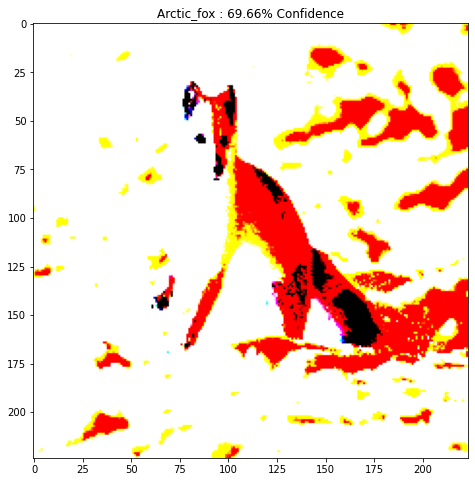

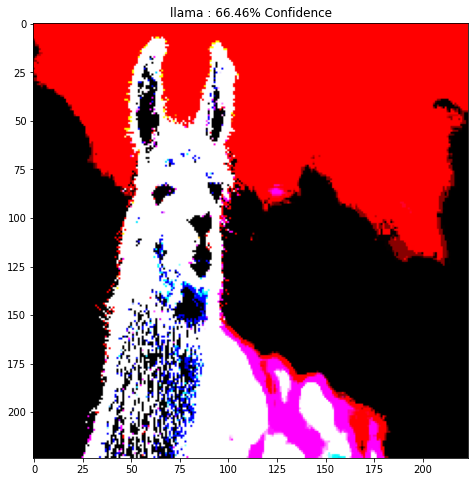

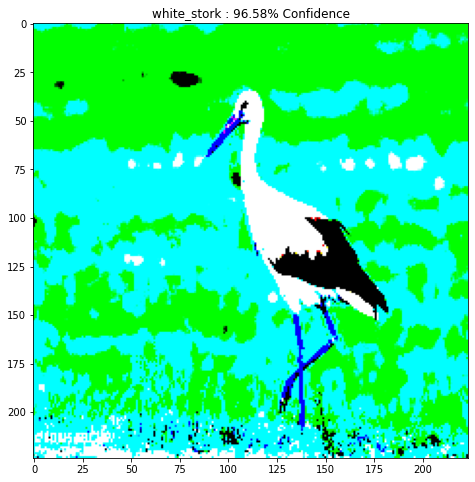

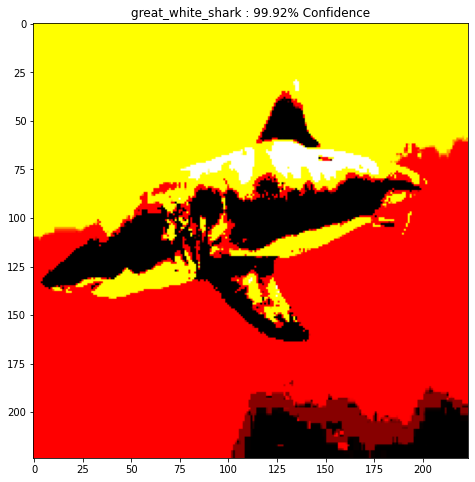

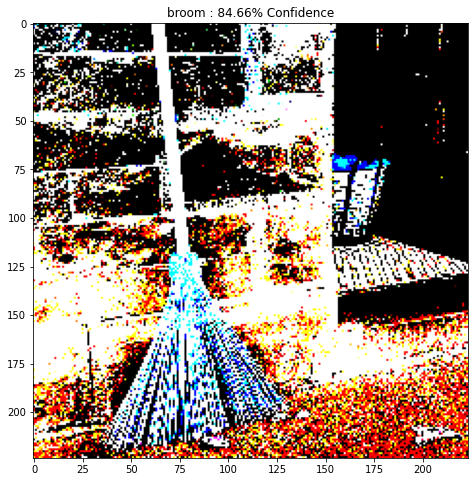

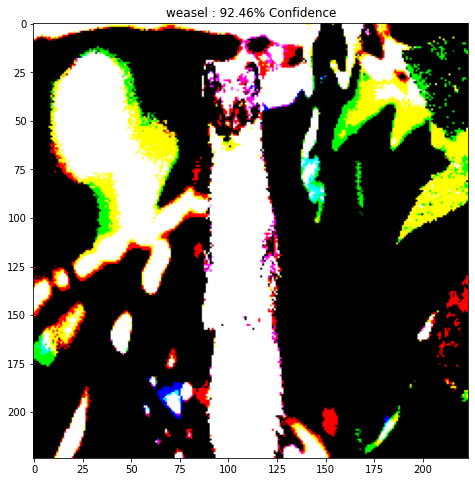

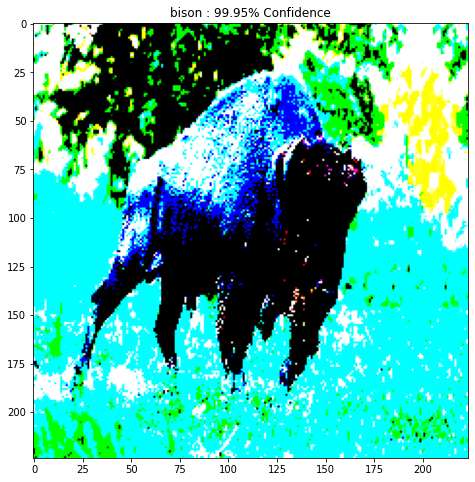

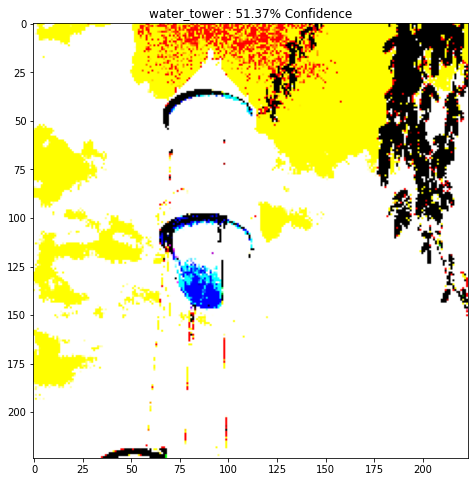

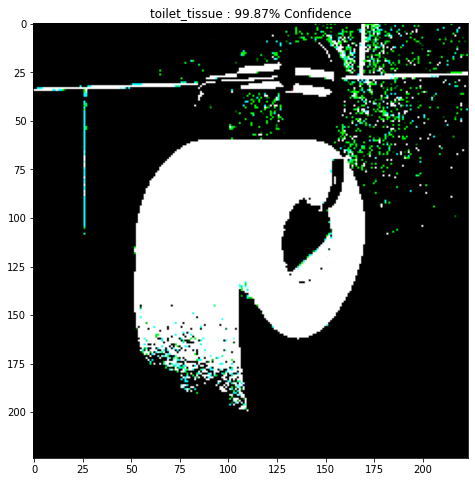

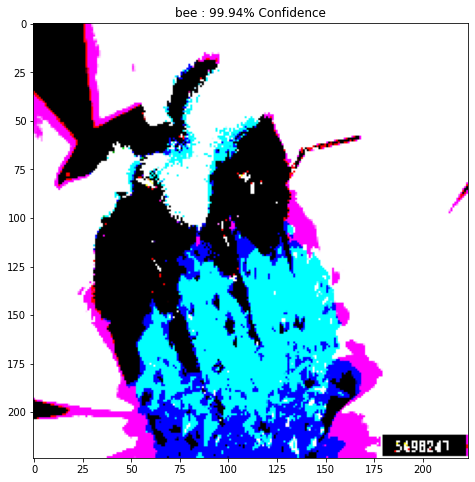

In [151]:
### Just testing
pretrained_model = tf.keras.applications.VGG16(weights='imagenet')
decode_predictions = tf.keras.applications.vgg16.decode_predictions
def preprocess(image):
  image = tf.cast(image, tf.float32)
  image = tf.image.resize(image, (224, 224))    
  image = tf.keras.applications.vgg16.preprocess_input(image)
  image = image[None, ...]
  return image
ten_image_names = ["Arctic_fox", #279
                   "llama", #355
                   "white_stork", #127
                   "great_white_shark", #2
                   "broom", #462
                   "weasel", #356
                   "bison", #347
                   "water_tower", #900
                   "toilet_tissue", #999
                   "bee"] #309
ten_image_index = [279, 355, 127, 2, 462, 356, 347, 90, 999, 309]
image = [tf.zeros([0,4]) for i in range(10)]
image_probs = [np.zeros(0) for i in range(10)]
for i in range(10):
  image_raw = tf.io.read_file('/content/drive/My Drive/Colab Notebooks/images/'+ten_image_names[i]+'.jpg')
  image[i] = tf.image.decode_image(image_raw)

  image[i] = preprocess(image[i])
  image_probs[i] = pretrained_model.predict(image[i])
for i in range(10):
  plt.figure()
  plt.imshow(image[i][0] * 0.5 + 0.5)  # To change [-1, 1] to [0,1]
  _, image_class, class_confidence = get_imagenet_label(image_probs[i])
  plt.title('{} : {:.2f}% Confidence'.format(image_class, class_confidence*100))
  #plt.show()

# BONUS: Can you provide a better attack?

Can you design a better attack that lowers the epsilon required for the images?

Task:

* Design another attack. 
* Compare the epsilon values on 10 images. 
* Does it perform better than the FGSM attack? That is, does it have lower epsilon values?

Write the code and provide your answers below. 